# Comparing Clustering Methods on Toy Datasets

---

## Learning Objectives

By the end of this notebook, you will be able to:

1. **Understand** the fundamental differences between clustering algorithms
2. **Recognize** which clustering methods work best for different data shapes
3. **Apply** multiple clustering techniques using scikit-learn
4. **Evaluate** clustering performance using silhouette scores and WCSS
5. **Identify** the strengths and weaknesses of each method

## Why Compare Clustering Methods?

In real-world data science, **no single clustering algorithm works best for all datasets**. Different algorithms make different assumptions about the structure of your data:

- **K-Means**: Assumes spherical clusters of similar size
- **Hierarchical (Agglomerative)**: Builds clusters incrementally; linkage method matters
- **DBSCAN**: Finds arbitrary-shaped clusters based on density

This notebook uses **synthetic toy datasets** with known structures to help you develop intuition about when each method succeeds or fails.

## Datasets We'll Explore

We'll test four clustering methods on six different dataset shapes:

1. **Circles**: Concentric rings (non-convex shapes)
2. **Moons**: Crescent shapes (non-linear separability)
3. **Blobs**: Well-separated spherical clusters (ideal case)
4. **No Structure**: Uniform random points (no true clusters)
5. **Anisotropic**: Stretched/rotated clusters (non-spherical)
6. **Varied Variance**: Clusters with different densities

## Clustering Methods We'll Compare

For each dataset, we'll apply:

1. **K-Means** (partition-based)
2. **Agglomerative with Complete Linkage** (hierarchical)
3. **DBSCAN** (density-based)
4. **Agglomerative with Single Linkage** (hierarchical)

## How Each Method Works: Intuitive Explanations

### 1. **K-Means** (Partition-Based)
**Think of it as**: Finding K "center points" and assigning each data point to the nearest center.

**How it works**:
- Start with K random center points (centroids)
- Assign each point to its nearest centroid
- Move centroids to the average position of their assigned points
- Repeat until centroids stop moving

**Key assumption**: Clusters are spherical (circular/ball-shaped) with similar sizes

**Best for**: Well-separated, roughly circular clusters of similar size

---

### 2. **Agglomerative Hierarchical - Complete Linkage** (Bottom-Up)
**Think of it as**: Starting with every point as its own cluster, then repeatedly merging the two "most similar" clusters.

**How it works**:
- Each point starts as a tiny cluster of size 1
- Find the two clusters with the smallest distance between their **farthest points** (complete linkage)
- Merge them into one cluster
- Repeat until you have K clusters

**Key characteristic**: Creates compact, spherical clusters by using the maximum distance

**Best for**: Finding well-defined, compact groups

---

### 3. **DBSCAN** (Density-Based Spatial Clustering)
**Think of it as**: Finding "crowded neighborhoods" of points and treating sparse areas as noise/outliers.

**How it works**:
- Pick a point and find all neighbors within radius `eps`
- If it has enough neighbors (`min_samples`), start a cluster
- Expand the cluster by including neighbors of neighbors
- Points in sparse regions are labeled as outliers

**Key characteristic**: Discovers clusters of arbitrary shapes; identifies outliers

**Best for**: Non-spherical clusters, noisy data, when you don't know K in advance

---

### 4. **Agglomerative Hierarchical - Single Linkage** (Bottom-Up)
**Think of it as**: Like complete linkage, but using the distance between **closest points** instead.

**How it works**:
- Each point starts as its own cluster
- Find the two clusters with the smallest distance between their **nearest points** (single linkage)
- Merge them
- Repeat until you have K clusters

**Key characteristic**: Can "chain" through elongated structures by connecting nearest neighbors

**Best for**: Elongated, non-spherical clusters; can struggle with clusters of different densities

**Warning**: Prone to "chaining effect" where clusters merge into one long chain

---

**Useful Resources:**

- [Scikit-learn Clustering Overview](https://scikit-learn.org/stable/modules/clustering.html)
- [K-Means Documentation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)
- [DBSCAN Documentation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html)

## Step 1: Import Required Libraries

We'll use:
- **NumPy**: Numerical computations and array operations
- **Pandas**: Data manipulation and analysis
- **Matplotlib**: Data visualization
- **Scikit-learn**: Machine learning algorithms and synthetic datasets
- **SciPy**: Scientific computing (for hierarchical clustering)

In [1]:
# We import the necessary libraries
import time # This module provides various time-related functions
import warnings # Warning messages are typically issued in situations where it is useful to alert the user of some condition in a program
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import cluster, datasets
from sklearn.preprocessing import StandardScaler # Standardize features by removing the mean and scaling to unit variance.
from itertools import cycle, islice # This module implements a number of iterator building blocks

## Step 2: Create Synthetic Datasets

We'll generate six different synthetic datasets, each with 1,500 data points. These datasets represent different challenges for clustering algorithms.

### Dataset Descriptions:

1. **Circles (`make_circles`)**: Two concentric circles. Tests whether algorithms can handle non-convex shapes.
   - `factor=0.5`: Inner circle radius is 50% of outer circle
   - `noise=0.05`: Small random noise added to each point

2. **Moons (`make_moons`)**: Two interleaving half-circles. Tests non-linear cluster boundaries.

3. **Blobs (`make_blobs`)**: Well-separated spherical clusters. This is the "ideal" case for most algorithms.

4. **No Structure**: Uniformly distributed random points with no inherent clusters. Tests whether algorithms inappropriately force structure.

5. **Anisotropic**: Blobs that have been stretched and rotated via a transformation matrix. Tests sensitivity to cluster shape.

6. **Varied Variance**: Blobs with different densities/spreads (`cluster_std=[1.0, 2.5, 0.5]`). Tests handling of unequal cluster sizes.

In [2]:
# We create the datasets
n_samples = 1500
X_circles, y_circles = datasets.make_circles(n_samples=n_samples, factor=0.5, noise=0.05) # noise: Standard deviation of Gaussian noise added to the data # factor: Scale factor between inner and outer circle in the range (0, 1).
X_moons, y_moons = datasets.make_moons(n_samples=n_samples, noise=0.05)
X_blobs, y_blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
X_no_structure, y_no_structure = np.random.rand(n_samples, 2), None


### Anisotropic (Stretched) Clusters

### Blobs with Varied Variances

In [3]:
# Dataset with points distributed along different axes
random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

# Blobs dataset with varied variances
X_varied, y_varied = datasets.make_blobs(
    n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state
)

## Step 3: Visualize the Datasets

Before applying clustering algorithms, let's visualize each dataset to understand their structure. This helps us develop intuition about which algorithms might work well.

**Look for:**
- How many natural clusters appear to exist?
- Are clusters spherical or irregular?
- Are clusters well-separated or overlapping?
- Are clusters of similar or different densities?

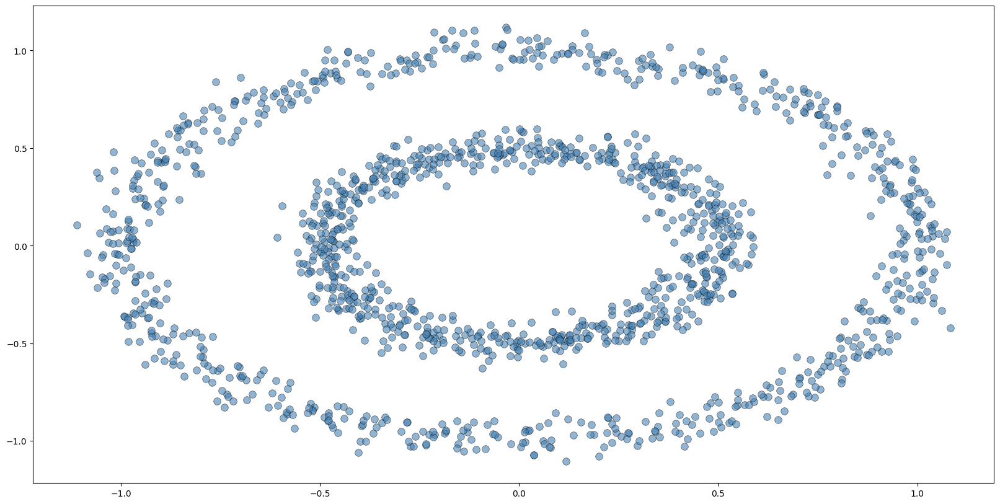

In [4]:
# Lets visualize the toy datasets we have created
# Circles dataset
plt.figure(figsize=(20,10))
plt.scatter(X_circles[:,0], X_circles[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

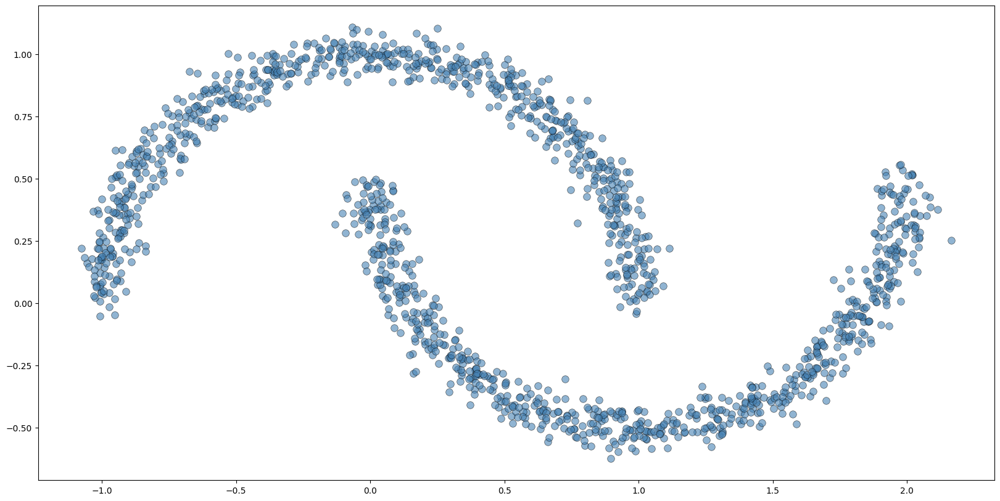

In [5]:
# Moons dataset
plt.figure(figsize=(20,10))
plt.scatter(X_moons[:,0], X_moons[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

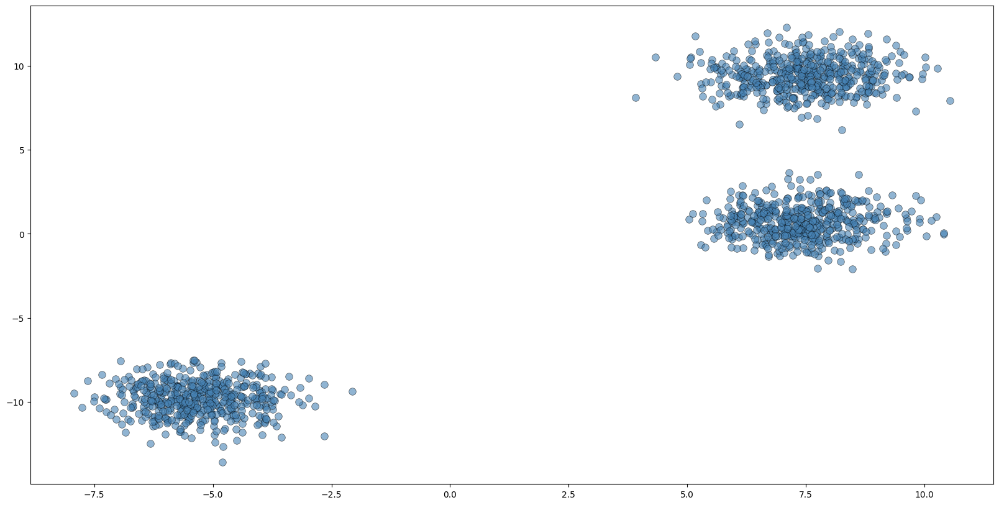

In [6]:
# Blobs dataset
plt.figure(figsize=(20,10))
plt.scatter(X_blobs[:,0], X_blobs[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

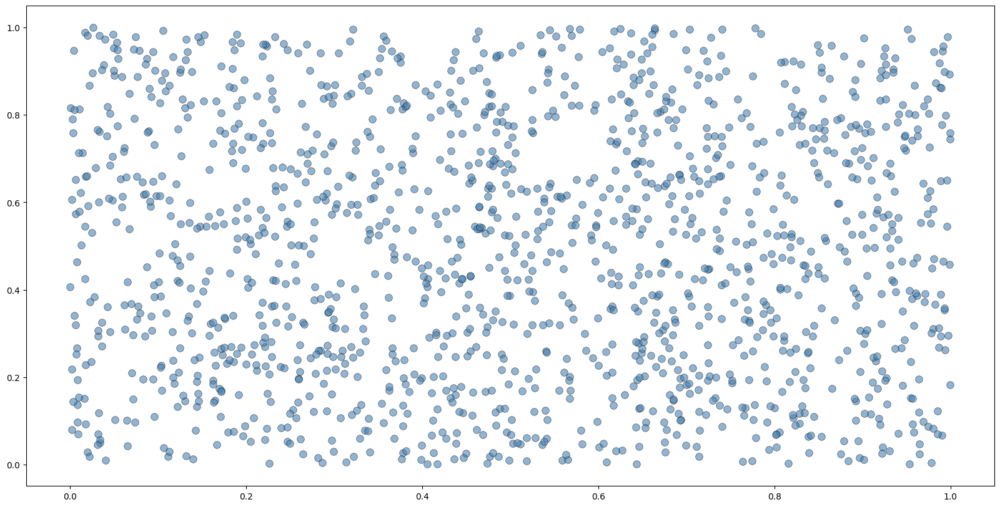

In [7]:
# Uniform points (no_structure dataset)
plt.figure(figsize=(20,10))
plt.scatter(X_no_structure[:,0], X_no_structure[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

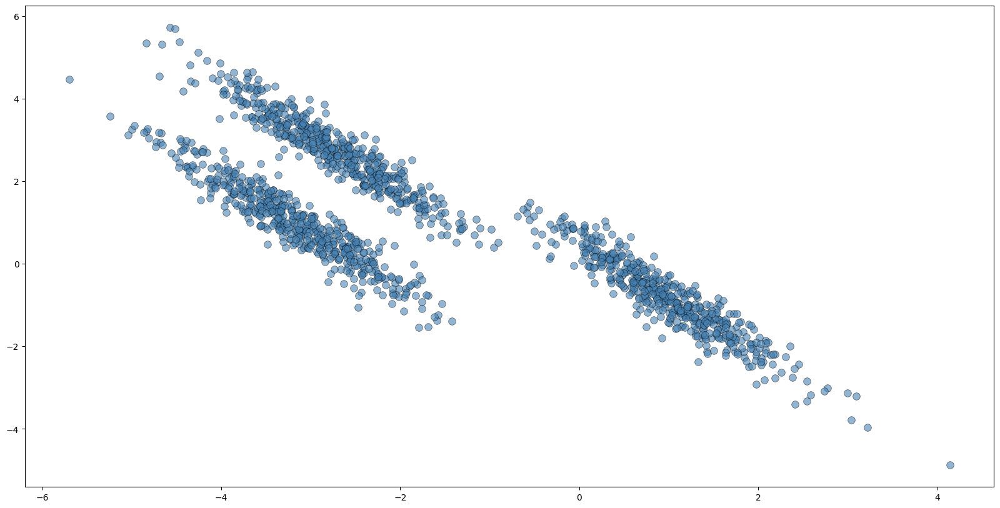

In [8]:
# Dataset with points distributed along different axes
plt.figure(figsize=(20,10))
plt.scatter(X_aniso[:,0], X_aniso[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

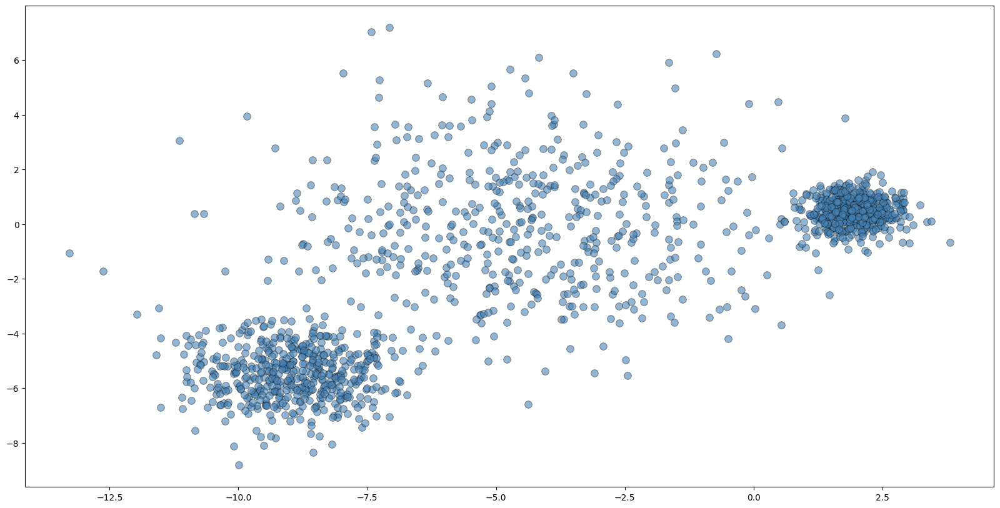

In [9]:
# Blobs dataset with varied variances
plt.figure(figsize=(20,10))
plt.scatter(X_varied[:,0], X_varied[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

## Step 4: Define Helper Functions

We'll create wrapper functions for each clustering method that return:
- **Silhouette Score**: Measures how well-separated clusters are (1 = best, 0 = overlapping, -1 = poor)
- **WCSS (Within-Cluster Sum of Squares)**: Total variance within clusters (lower is better)
- **Labels**: Cluster assignment for each point
- **Centroids**: Center points of each cluster

### Function 1: K-Means Clustering

K-Means tries to minimize the distance between points and their assigned cluster centroids.

In [10]:
# In the next step we define some functions that we need.
# Define cluster_kmeans function
from sklearn.cluster import KMeans
from sklearn import metrics
# from sklearn.metrics import pairwise_distances

# silhouette: 1=good, 0=overlap, -1=bad
# Within Cluster Sum of Squares: lower is better

def cluster_kmeans(df, nclust):

    kmeans = KMeans(n_clusters=nclust, random_state=0).fit(df)
    label = kmeans.labels_
    centroids = kmeans.cluster_centers_
    sil=metrics.silhouette_score(df, label, metric='euclidean', random_state=0)
    wcss = kmeans.inertia_

    return sil, wcss, label, centroids

### Function 2: Agglomerative Hierarchical Clustering

Agglomerative clustering starts with each point as its own cluster and iteratively merges the closest clusters.

**Linkage methods**:
- **Single linkage**: Distance between closest points in two clusters (can create "chains")
- **Complete linkage**: Distance between farthest points (creates more compact clusters)
- **Average linkage**: Average distance between all pairs of points

In [11]:
# Define cluster_agglom function
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
def cluster_agglom(df, nclust, link):

    hc = AgglomerativeClustering(n_clusters=nclust, metric = 'euclidean', linkage = link).fit(df)
    label = hc.labels_
    wcss, centroids = eval_WCSS(X, label)
    sil=metrics.silhouette_score(df, label, metric='euclidean', random_state=0)

    return sil, wcss, label, centroids

### Function 3: Calculate Within-Cluster Sum of Squares (WCSS)

WCSS measures cluster compactness by summing squared distances from each point to its cluster centroid.

In [12]:
# Define eval_WCSS function
def eval_WCSS(X, label):

    df = pd.DataFrame(data=X, index=label)
    centroids = df.groupby(level=0).mean()

    WCSS = 0
    for clust, centr in centroids.iterrows():

        points = df[df.index == clust]
        SS = 0
        for _, p in points.iterrows():
            SS += sum((p.values-centr.values)**2)
        WCSS += SS

    return WCSS, centroids.values

---

# Dataset 1: Concentric Circles

## Challenge: Non-Convex Clusters

The circles dataset contains two concentric rings. This tests whether algorithms can identify non-convex (non-spherical) cluster shapes.

**Expected Results:**
- ❌ **K-Means**: Will likely fail because it assumes spherical clusters
- ❌ **Complete Linkage**: May struggle due to spherical bias
- ✅ **DBSCAN**: Should succeed if epsilon is tuned correctly
- ✅ **Single Linkage**: Can follow the ring structure ("chaining effect")

Let's see if our predictions are correct!

### Original Data (No Clustering)

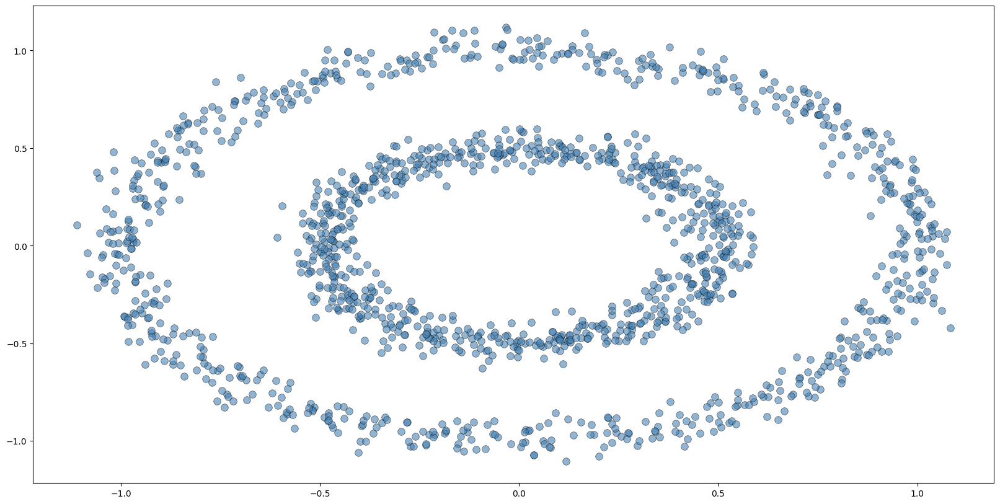

In [13]:
plt.figure(figsize=(20,10))
plt.scatter(X_circles[:,0], X_circles[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

### Method 1: K-Means Clustering

K-Means will try to split the data into 2 clusters by finding centroids that minimize within-cluster variance.

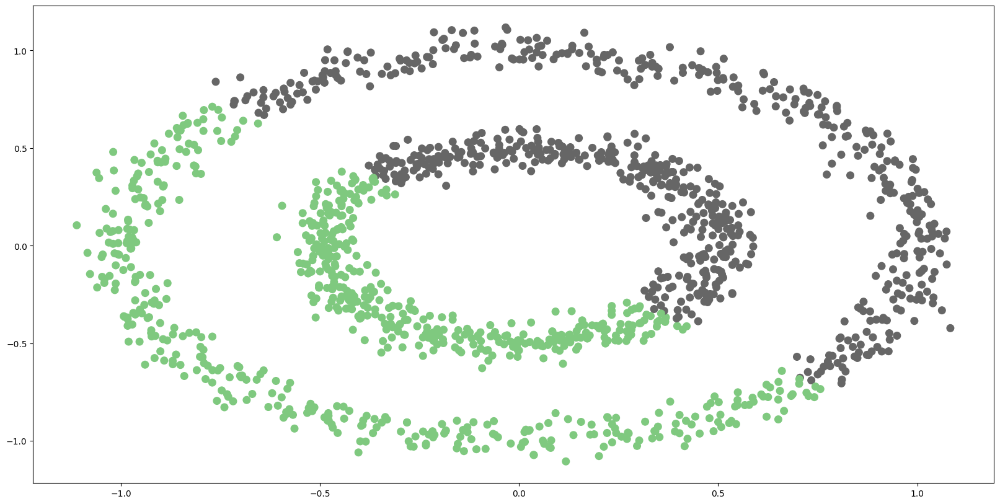

In [14]:
# K-means
sil, wcss, label, centroids = cluster_kmeans(X_circles, 2)
plt.figure(figsize=(20,10))
plt.scatter(X_circles[:,0], X_circles[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: K-Means splits the circles vertically/horizontally instead of separating inner and outer rings. This demonstrates K-Means' limitation with non-convex shapes—it assumes spherical clusters.

**Observation**: K-Means splits the circles vertically! This shows its limitation with non-convex shapes.

### Method 2: Agglomerative Clustering (Complete Linkage)

Complete linkage merges clusters based on the maximum distance between points.

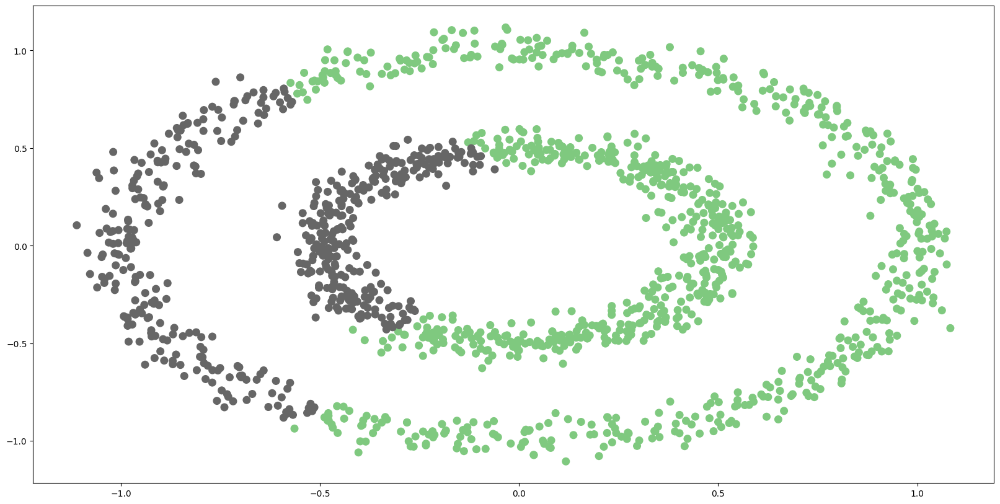

In [15]:
# Agglomerative clustering: complete link
sil, wcss, label, centroids = cluster_agglom(X_circles, 2, link='complete')
plt.figure(figsize=(20,10))
plt.scatter(X_circles[:,0], X_circles[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: Complete linkage also fails to separate the rings properly, showing similar behavior to K-Means due to its tendency toward compact, spherical clusters.

**Observation**: Complete linkage also fails, similar to K-Means.

### Method 3: DBSCAN (Density-Based)

DBSCAN groups points that are close together (density-connected) without assuming cluster shape.

**Key parameter**: `eps=0.2` defines the neighborhood radius for each point.

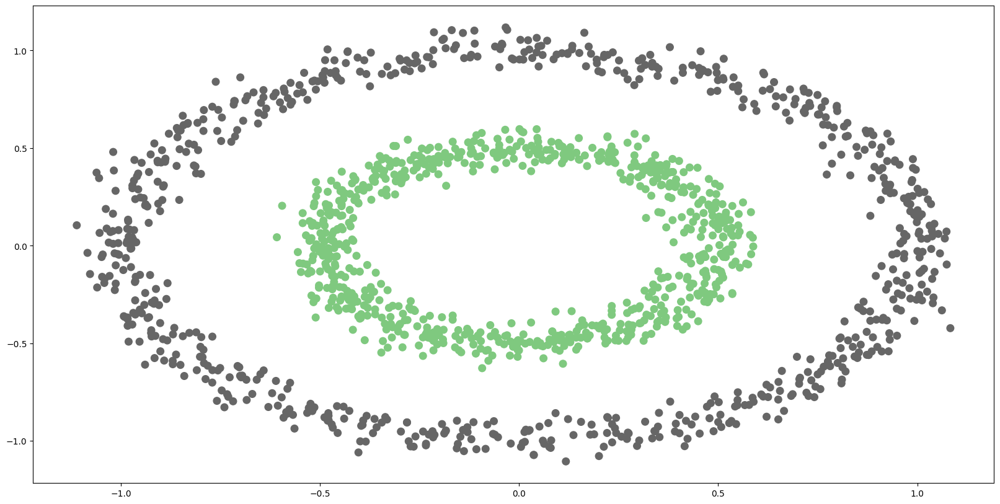

In [16]:
# DBScan
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.2).fit(X_circles) # epsfloat, default=0.5 --> The maximum distance between two samples for one to be considered as in the neighborhood of the other.

label = db.labels_
plt.figure(figsize=(20,10))
plt.scatter(X_circles[:,0], X_circles[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ✅ DBSCAN successfully identifies both concentric rings! It finds density-connected regions without assuming spherical shapes, making it ideal for this non-convex structure.

**Observation**: DBSCAN successfully identifies both rings! This demonstrates its strength with non-convex shapes.

### Method 4: Agglomerative Clustering (Single Linkage)

Single linkage merges clusters based on the minimum distance between points.

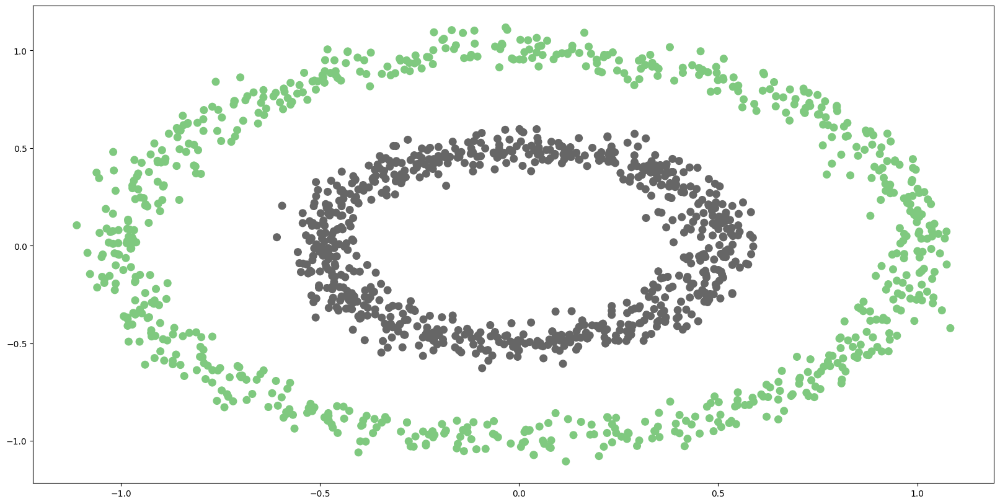

In [17]:
# Agglomerative clustering: single link
sil, wcss, label, centroids = cluster_agglom(X_circles, 2, link='single')
plt.figure(figsize=(20,10))
plt.scatter(X_circles[:,0], X_circles[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ✅ Single linkage also succeeds by following the ring structure through its "chaining" behavior, connecting nearby points along the circles.

**Observation**: Single linkage also succeeds by following the ring structure through "chaining".

### Summary: Circles Dataset

| Method | Result | Reason |
|--------|--------|--------|
| K-Means | ❌ Failed | Assumes spherical clusters |
| Complete Linkage | ❌ Failed | Tends toward compact spherical clusters |
| DBSCAN | ✅ Success | Density-based; no shape assumptions |
| Single Linkage | ✅ Success | Can chain through elongated structures |

**Key Insight**: For non-convex shapes, use density-based (DBSCAN) or single-linkage methods.

---

# Dataset 2: Moons (Crescent Shapes)

## Challenge: Non-Linear Separability

The moons dataset contains two interleaving crescent shapes. No straight line can separate them.

**Expected Results:** Similar to circles, density-based methods should excel.

### Original Data (No Clustering)

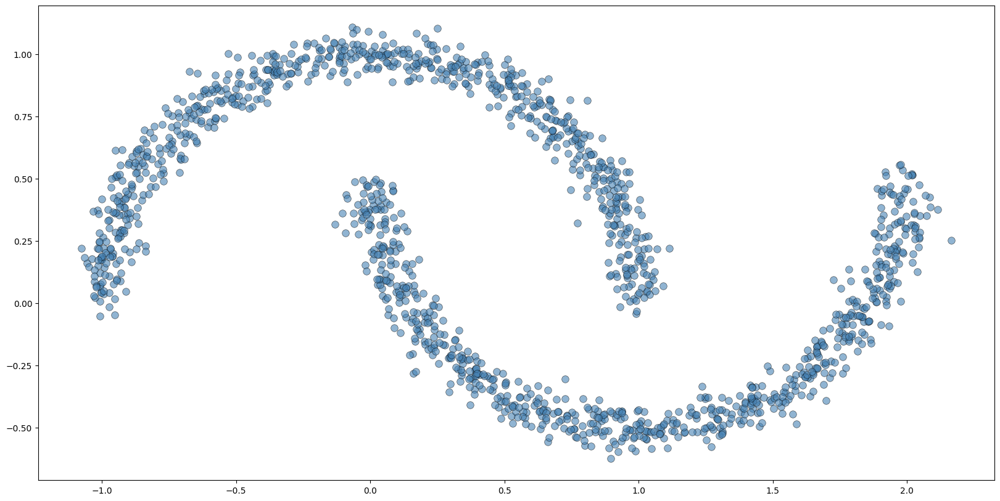

In [18]:
plt.figure(figsize=(20,10))
plt.scatter(X_moons[:,0], X_moons[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

### Method 1: K-Means

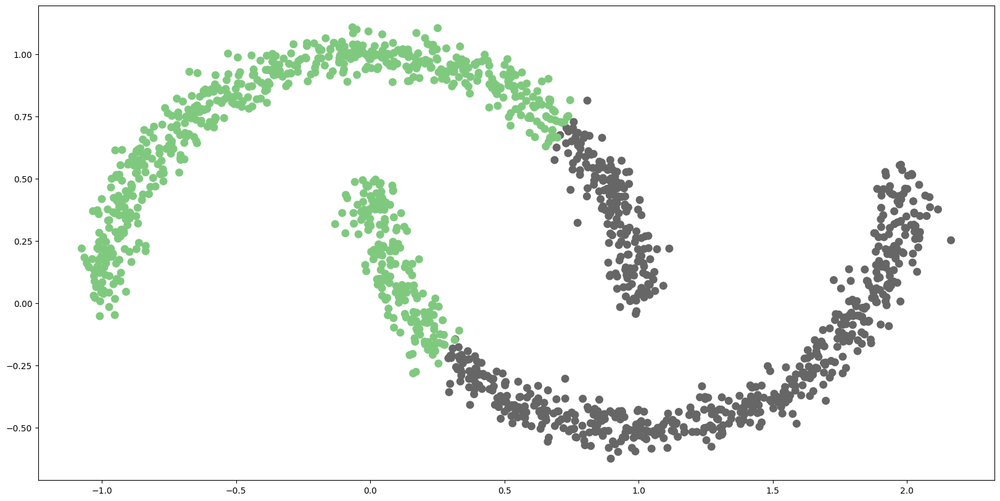

In [19]:
# K-means
sil, wcss, label, centroids = cluster_kmeans(X_moons, 2)
plt.figure(figsize=(20,10))
plt.scatter(X_moons[:,0], X_moons[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: K-Means struggles to separate the crescents properly, cutting across the moons with straight decision boundaries. The algorithm cannot handle the non-linear cluster shapes.

**Observation**: K-Means struggles to separate the crescent shapes properly.

### Method 2: Agglomerative (Complete Linkage)

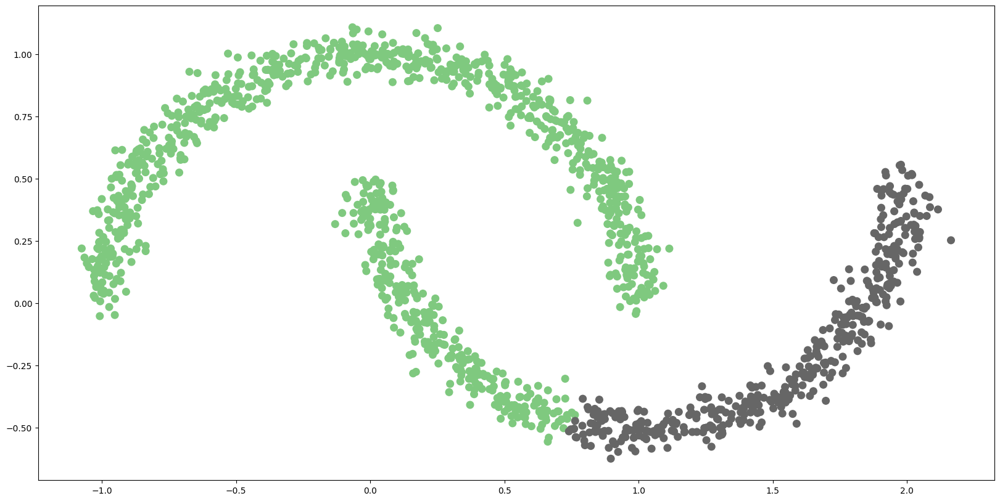

In [20]:
# Agglomerative clustering: complete link
sil, wcss, label, centroids = cluster_agglom(X_moons, 2, link='complete')
plt.figure(figsize=(20,10))
plt.scatter(X_moons[:,0], X_moons[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: Complete linkage shows some improvement but still misclassifies points where the crescents come close together.

### Method 3: DBSCAN

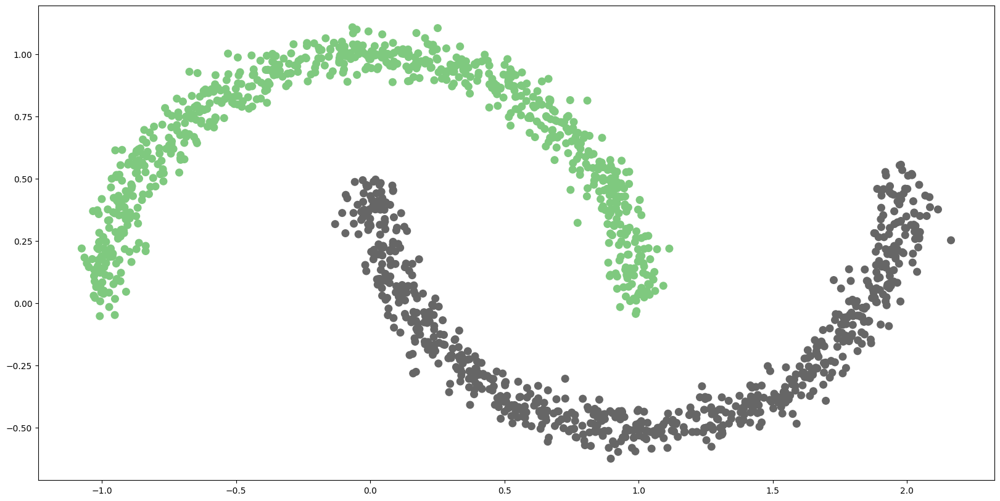

In [21]:
# DBScan
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.2).fit(X_moons) # epsfloat, default=0.5 --> The maximum distance between two samples for one to be considered as in the neighborhood of the other.

label = db.labels_
plt.figure(figsize=(20,10))
plt.scatter(X_moons[:,0], X_moons[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ✅ DBSCAN cleanly separates the two crescent shapes! It follows the density contours without requiring linear boundaries.

**Observation**: DBSCAN cleanly separates the two crescents!

### Method 4: Agglomerative (Single Linkage)

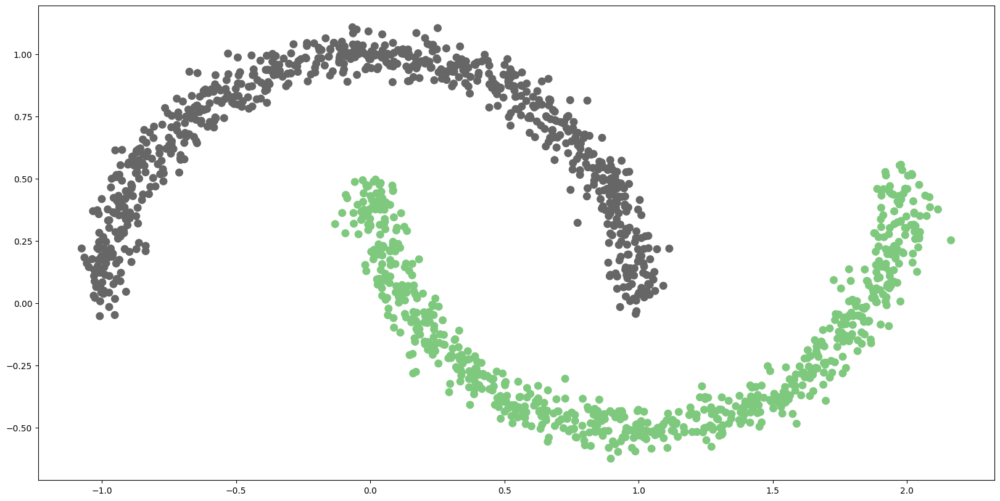

In [22]:
# Agglomerative clustering: single link
sil, wcss, label, centroids = cluster_agglom(X_moons, 2, link='single')
plt.figure(figsize=(20,10))
plt.scatter(X_moons[:,0], X_moons[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ✅ Single linkage successfully separates the moons by chaining through the crescent structures.

### Summary: Moons Dataset

| Method | Result | Reason |
|--------|--------|--------|
| K-Means | ❌ Failed | Linear boundaries don't work |
| Complete Linkage | ⚠️ Partial | Some misclassification |
| DBSCAN | ✅ Success | Follows density contours |
| Single Linkage | ✅ Success | Chains through crescent shapes |

**Key Insight**: Non-linear boundaries require density-based or flexible hierarchical methods.

---

# Dataset 3: Well-Separated Blobs

## Challenge: None (Ideal Case)

This dataset has well-separated, spherical clusters. This is the **ideal scenario** for most clustering algorithms.

**Expected Results:** All methods should perform well.

### Original Data (No Clustering)

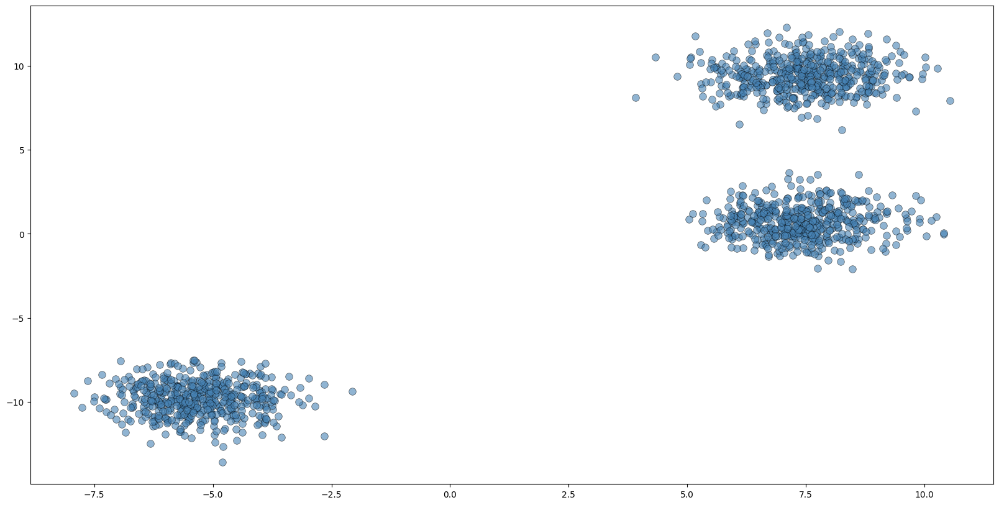

In [23]:
plt.figure(figsize=(20,10))
plt.scatter(X_blobs[:,0], X_blobs[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

### Method 1: K-Means

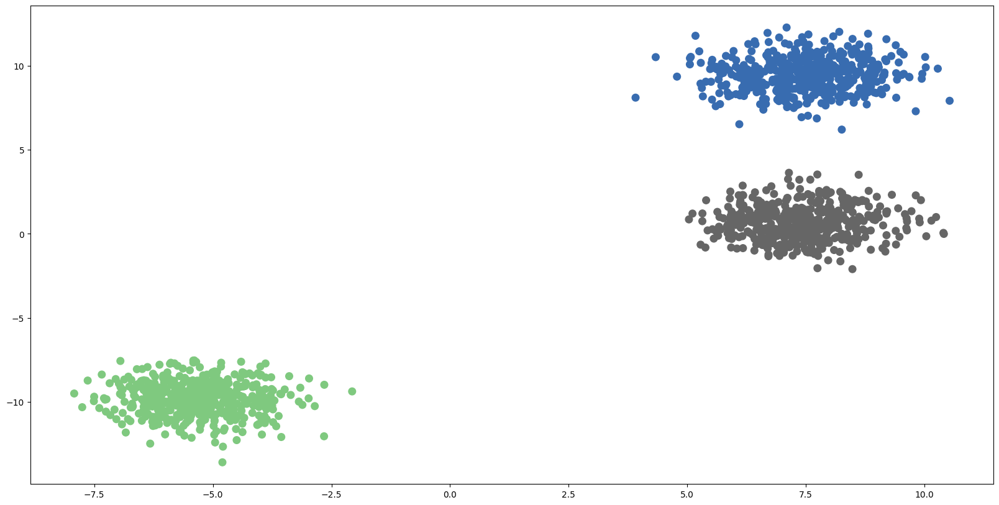

In [24]:
# K-means
sil, wcss, label, centroids = cluster_kmeans(X_blobs, 3)
plt.figure(figsize=(20,10))
plt.scatter(X_blobs[:,0], X_blobs[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ✅ K-Means performs perfectly! This is the ideal scenario—well-separated, spherical clusters match K-Means' assumptions exactly.

**Observation**: K-Means performs perfectly on well-separated spherical clusters.

### Method 2: Agglomerative (Complete Linkage)

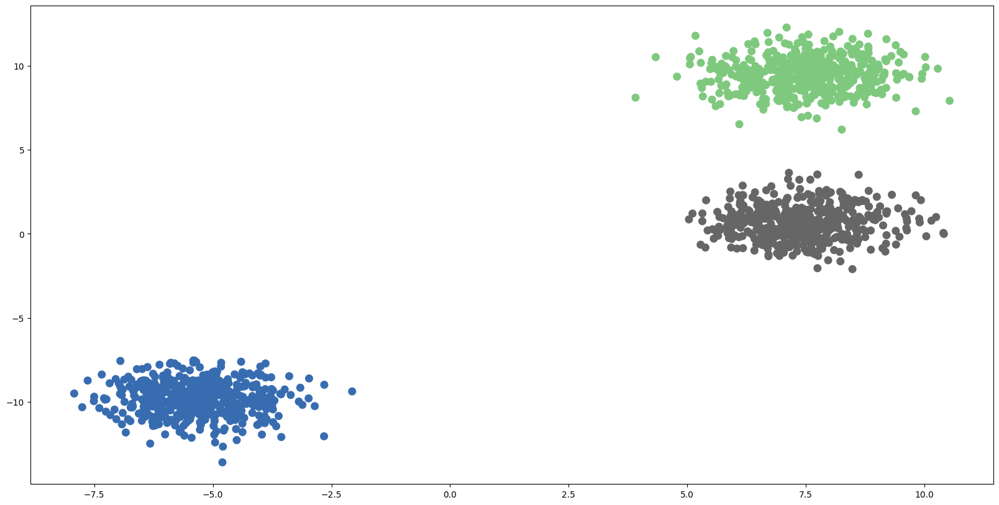

In [25]:
# Agglomerative clustering: complete link
sil, wcss, label, centroids = cluster_agglom(X_blobs, 3, link='complete')
plt.figure(figsize=(20,10))
plt.scatter(X_blobs[:,0], X_blobs[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ✅ Complete linkage also works well, producing clean, compact clusters.

### Method 3: DBSCAN

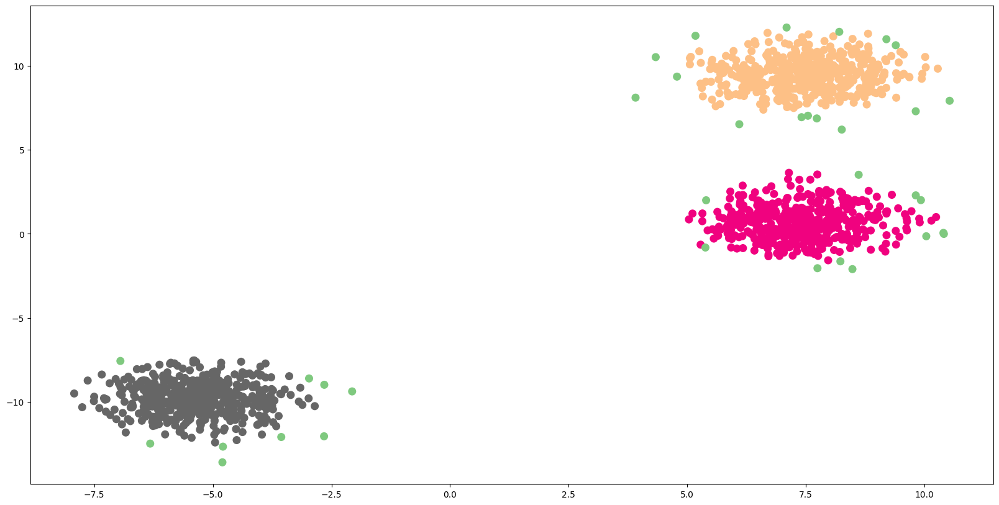

In [26]:
# DBScan
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.5).fit(X_blobs) # epsfloat, default=0.5 --> The maximum distance between two samples for one to be considered as in the neighborhood of the other.

label = db.labels_
plt.figure(figsize=(20,10))
plt.scatter(X_blobs[:,0], X_blobs[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: DBSCAN works but requires careful `eps` tuning. Too small creates many clusters; too large merges everything. The parameter choice shown here produces reasonable results.

**Note**: DBSCAN's `eps` parameter needs tuning. Too small = many clusters; too large = one cluster.

### Method 4: Agglomerative (Single Linkage)

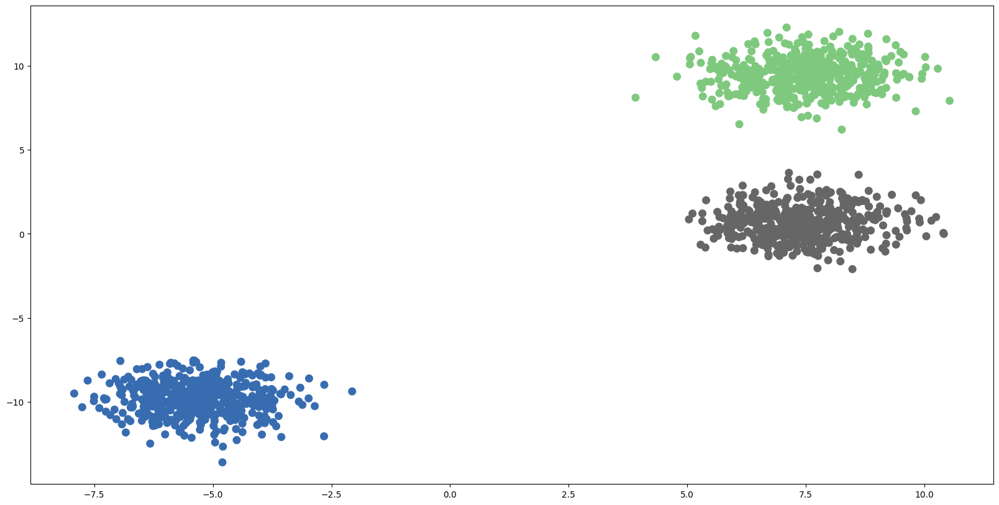

In [27]:
# Agglomerative clustering: single link
sil, wcss, label, centroids = cluster_agglom(X_blobs, 3, link='single')
plt.figure(figsize=(20,10))
plt.scatter(X_blobs[:,0], X_blobs[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ✅ Single linkage works but may create some chaining between clusters if `eps` parameters aren't optimal. Generally performs well on well-separated data.

### Summary: Blobs Dataset

| Method | Result | Reason |
|--------|--------|--------|
| K-Means | ✅ Success | Perfect for spherical clusters |
| Complete Linkage | ✅ Success | Works well with compact clusters |
| DBSCAN | ⚠️ Sensitive | Requires careful `eps` tuning |
| Single Linkage | ✅ Success | Works but may create chains unnecessarily |

**Key Insight**: For well-separated spherical clusters, K-Means is fast and effective.

---

# Dataset 4: No Structure (Random Uniform)

## Challenge: No True Clusters Exist

This dataset is uniformly distributed random noise with **no inherent cluster structure**.

**Expected Results:** 
- ❌ Partition-based methods (K-Means) will **force** structure where none exists
- ✅ DBSCAN might identify this as noise (all points as outliers)

This tests whether algorithms inappropriately impose structure on structureless data.

### Original Data (No Clustering)

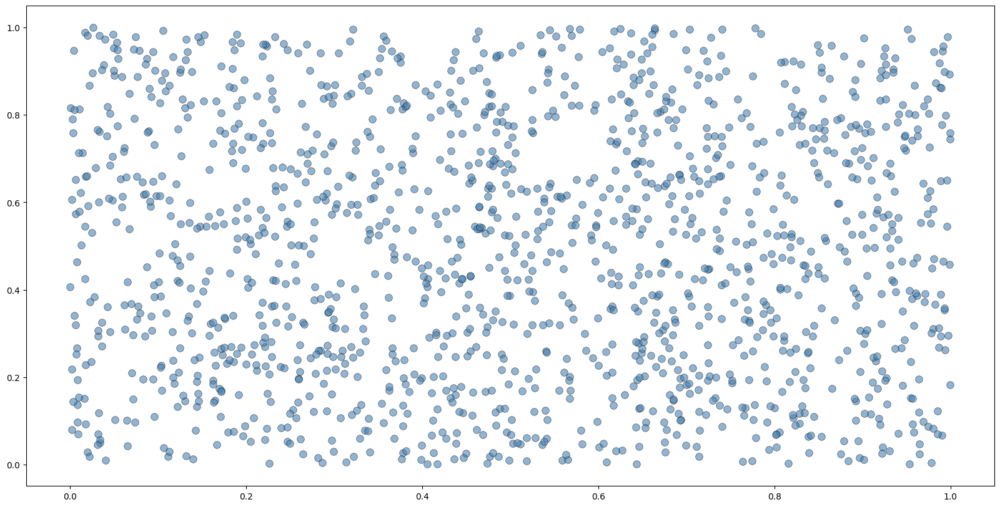

In [28]:
plt.figure(figsize=(20,10))
plt.scatter(X_no_structure[:,0], X_no_structure[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

### Method 1: K-Means

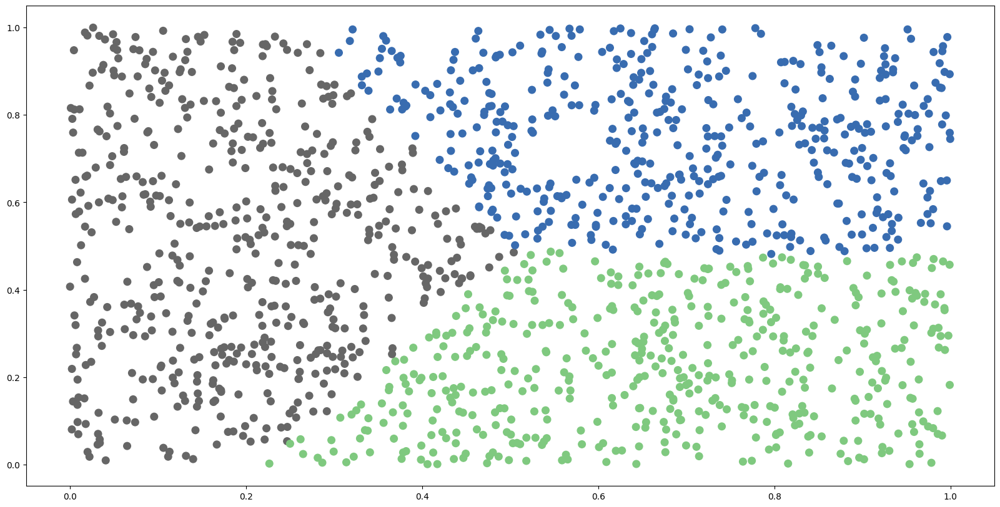

In [29]:
# K-means
sil, wcss, label, centroids = cluster_kmeans(X_no_structure, 3)
plt.figure(figsize=(20,10))
plt.scatter(X_no_structure[:,0], X_no_structure[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ⚠️ K-Means **forces** 3 clusters even though no natural clusters exist! This is a critical limitation—K-Means always creates exactly K clusters, whether or not they're meaningful.

**Observation**: K-Means **forces** 3 clusters even though no natural clusters exist! This is a major limitation.

### Method 2: Agglomerative (Complete Linkage)

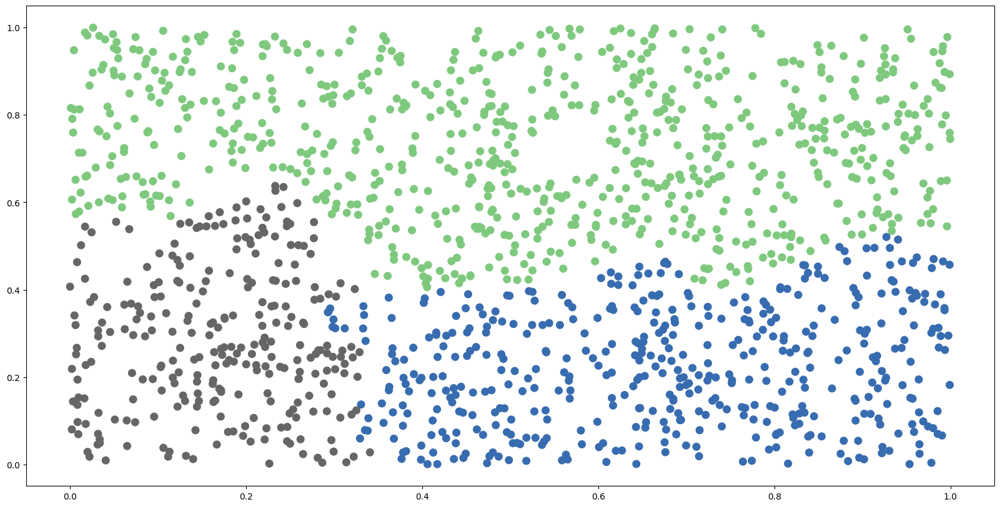

In [30]:
# Agglomerative clustering: complete link
sil, wcss, label, centroids = cluster_agglom(X_no_structure, 3, link='complete')
plt.figure(figsize=(20,10))
plt.scatter(X_no_structure[:,0], X_no_structure[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ⚠️ Complete linkage also imposes artificial structure on random noise, creating arbitrary cluster boundaries.

**Observation**: Hierarchical methods also impose structure inappropriately.

### Method 3: DBSCAN

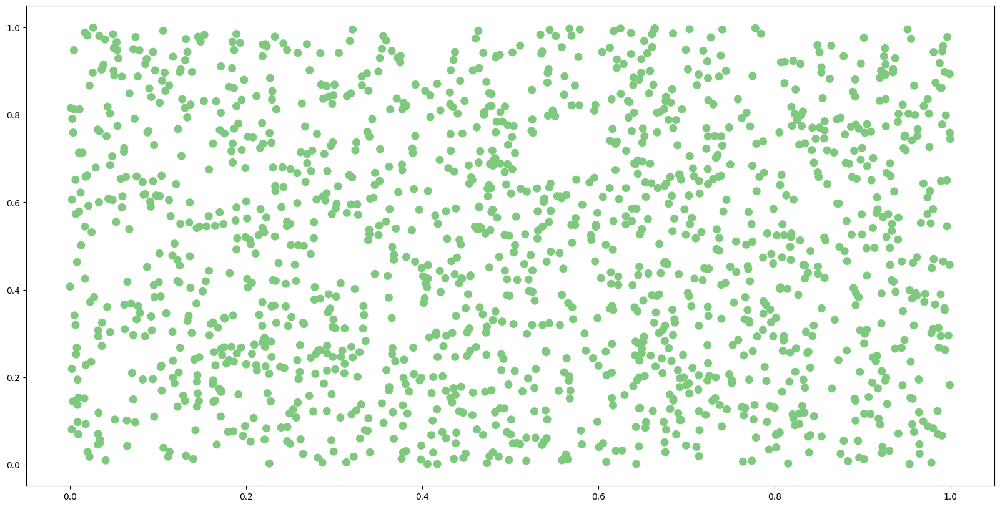

In [31]:
# DBScan
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.1).fit(X_no_structure) # epsfloat, default=0.5 --> The maximum distance between two samples for one to be considered as in the neighborhood of the other.

label = db.labels_
plt.figure(figsize=(20,10))
plt.scatter(X_no_structure[:,0], X_no_structure[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: DBSCAN with tight `eps` classifies many/most points as noise (label = -1), which is more appropriate for structureless data. However, with looser `eps`, it might still find spurious clusters.

**Observation**: DBSCAN may classify many points as noise (label = -1), which is more appropriate here.

### Method 4: Agglomerative (Single Linkage)

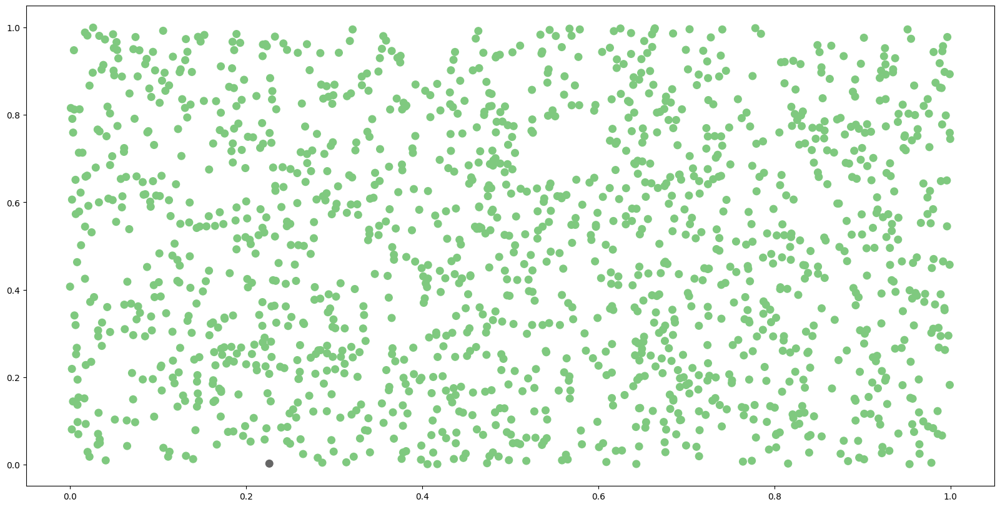

In [32]:
# Agglomerative clustering: single link
sil, wcss, label, centroids = cluster_agglom(X_no_structure, 2, link='single')
plt.figure(figsize=(20,10))
plt.scatter(X_no_structure[:,0], X_no_structure[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ⚠️ Single linkage creates arbitrary clusters through chaining effects on the random points.

### Summary: No Structure Dataset

| Method | Result | Reason |
|--------|--------|--------|
| K-Means | ❌ Misleading | Forces clusters where none exist |
| Complete Linkage | ❌ Misleading | Also imposes artificial structure |
| DBSCAN | ✅ Better | Can identify lack of dense clusters |
| Single Linkage | ❌ Misleading | Creates arbitrary boundaries |

**Key Insight**: Always validate that clusters are meaningful! Not all data has natural clusters.

---

# Dataset 5: Anisotropic (Stretched) Clusters

## Challenge: Non-Spherical Cluster Shapes

These clusters have been stretched and rotated by a transformation matrix, creating elongated (elliptical) shapes.

**Expected Results:**
- ❌ K-Means may struggle due to spherical assumption
- ✅ Hierarchical methods may adapt better

### Original Data (No Clustering)

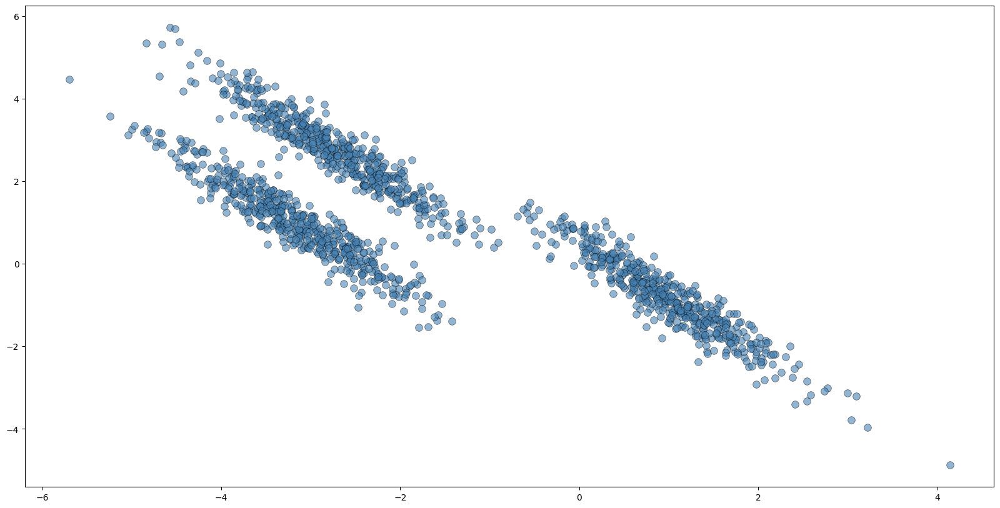

In [33]:
plt.figure(figsize=(20,10))
plt.scatter(X_aniso[:,0], X_aniso[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

### Method 1: K-Means

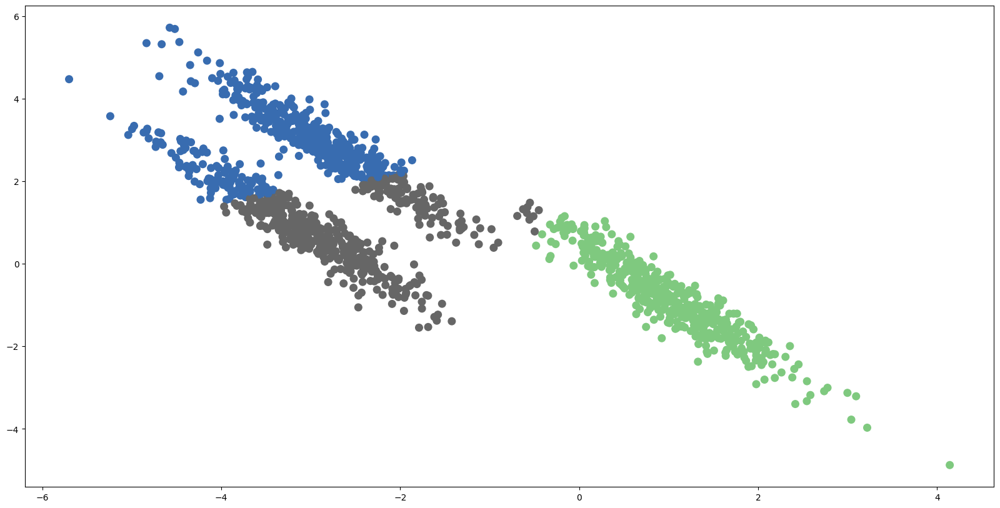

In [34]:
# K-means
sil, wcss, label, centroids = cluster_kmeans(X_aniso, 3)
plt.figure(figsize=(20,10))
plt.scatter(X_aniso[:,0], X_aniso[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: K-Means struggles with the elongated, rotated clusters. It tries to fit spherical boundaries, leading to poor separation of the stretched blobs.

**Observation**: K-Means struggles with the elongated shapes.

### Method 2: Agglomerative (Complete Linkage)

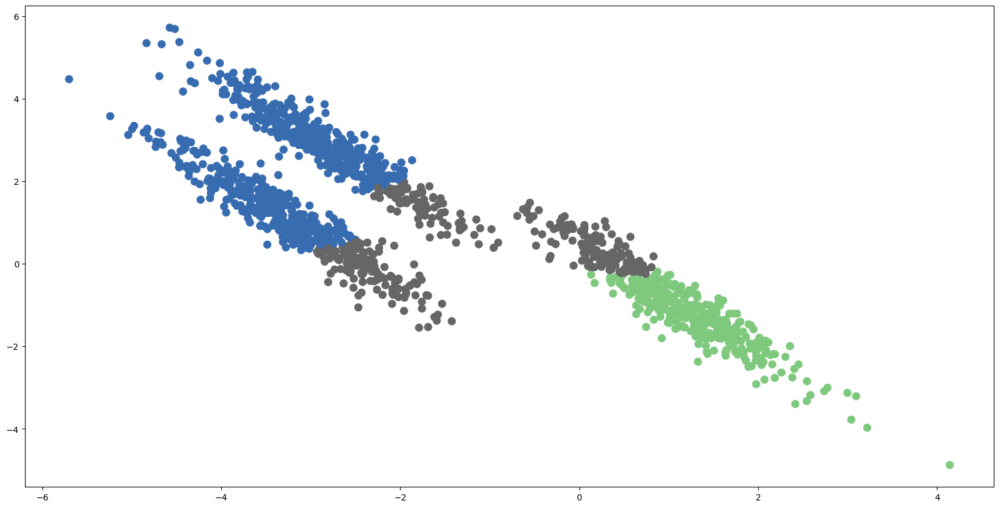

In [35]:
# Agglomerative clustering: complete link
sil, wcss, label, centroids = cluster_agglom(X_aniso, 3, link='complete')
plt.figure(figsize=(20,10))
plt.scatter(X_aniso[:,0], X_aniso[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: Complete linkage still struggles with the elongated shapes, creating somewhat arbitrary boundaries that don't follow the natural diagonal elongation. While it may separate the clusters slightly better than K-Means, it still imposes compact cluster assumptions rather than adapting to the stretched structure.

### Method 3: DBSCAN

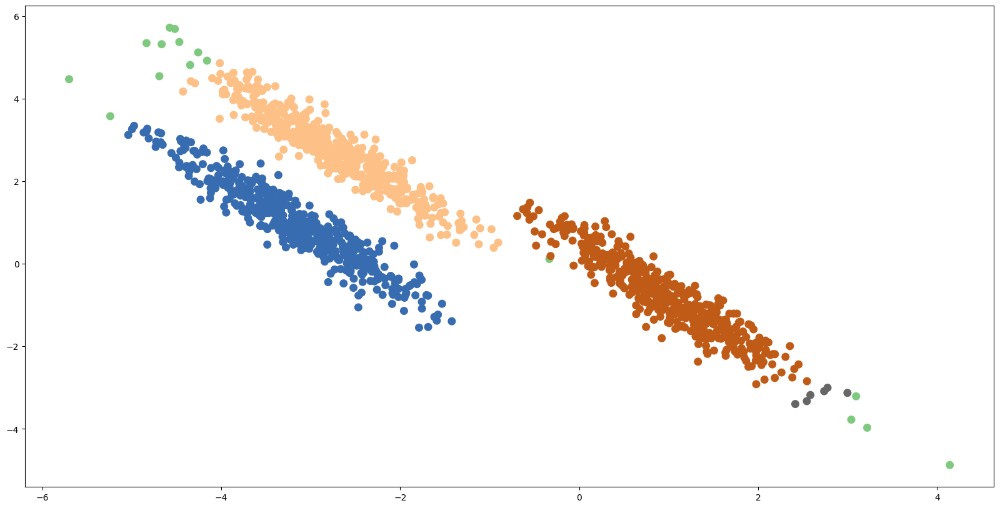

In [36]:
# DBScan
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.3).fit(X_aniso) # epsfloat, default=0.5 --> The maximum distance between two samples for one to be considered as in the neighborhood of the other.

label = db.labels_
plt.figure(figsize=(20,10))
plt.scatter(X_aniso[:,0], X_aniso[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: DBSCAN can work well if `eps` is tuned properly for the cluster density, but may struggle if densities vary within stretched clusters.

### Method 4: Agglomerative (Single Linkage)

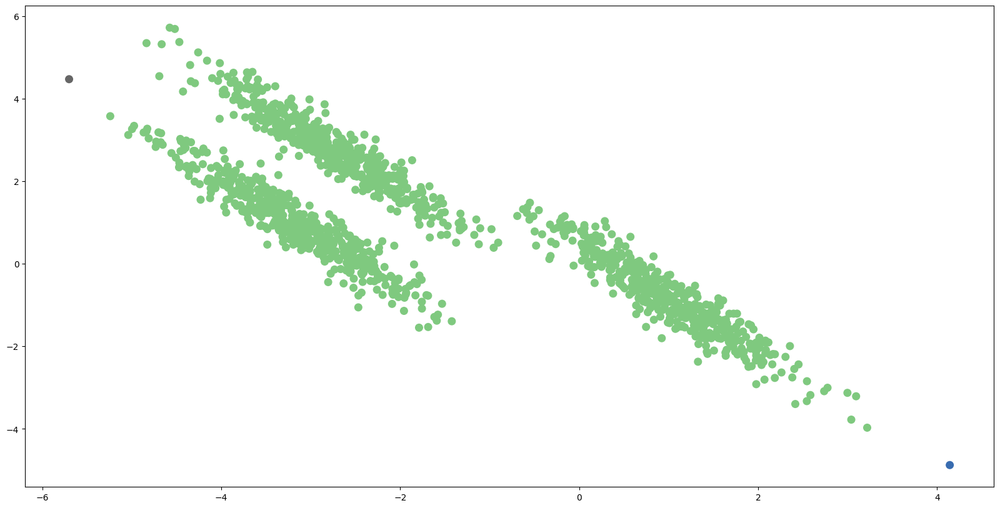

In [37]:
# Agglomerative clustering: single link
sil, wcss, label, centroids = cluster_agglom(X_aniso, 3, link='single')
plt.figure(figsize=(20,10))
plt.scatter(X_aniso[:,0], X_aniso[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: Single linkage handles elongated structures well due to its chaining ability, successfully following the stretched cluster shapes.

### Summary: Anisotropic Dataset

| Method | Result | Reason |
|--------|--------|--------|
| K-Means | ⚠️ Struggles | Spherical assumption violated |
| Complete Linkage | ⚠️ Struggles | Still imposes compact cluster boundaries |
| DBSCAN | ✅ Better  | Requires careful tuning |
| Single Linkage | ✅ Better | Can follow elongated structures |

**Key Insight**: When clusters are stretched or rotated, density-based or single linkage methods work better than partition-based or complete linkage methods.

---

# Dataset 6: Varied Variance (Different Densities)

## Challenge: Unequal Cluster Sizes and Densities

This dataset has three clusters with very different spreads:
- Cluster 1: `std = 1.0` (tight)
- Cluster 2: `std = 2.5` (loose)
- Cluster 3: `std = 0.5` (very tight)

**Expected Results:**
- ⚠️ K-Means assumes equal variance
- ⚠️ DBSCAN uses single `eps` parameter for all clusters

### Original Data (No Clustering)

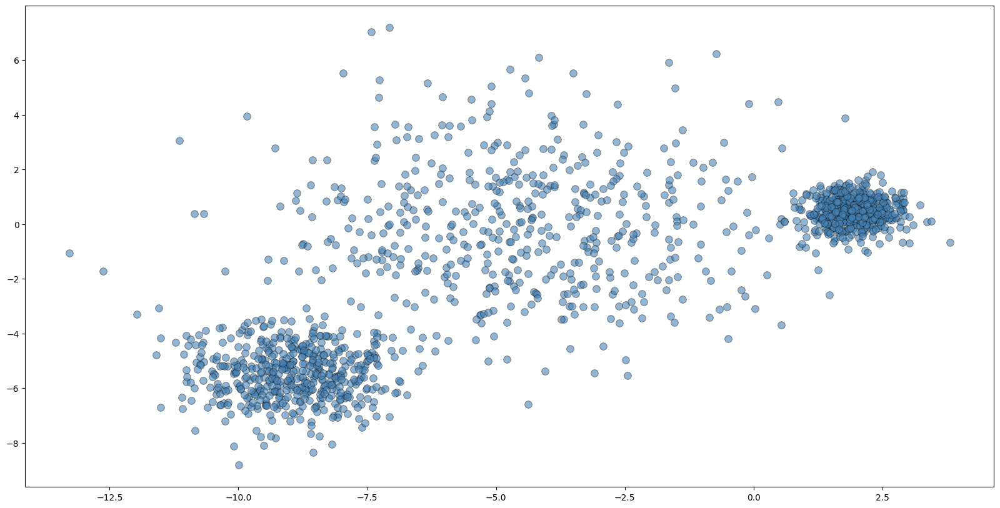

In [38]:
plt.figure(figsize=(20,10))
plt.scatter(X_varied[:,0], X_varied[:,1], color='steelblue', alpha=0.6, edgecolors='black', linewidth=0.5, s=70)
plt.show()

### Method 1: K-Means

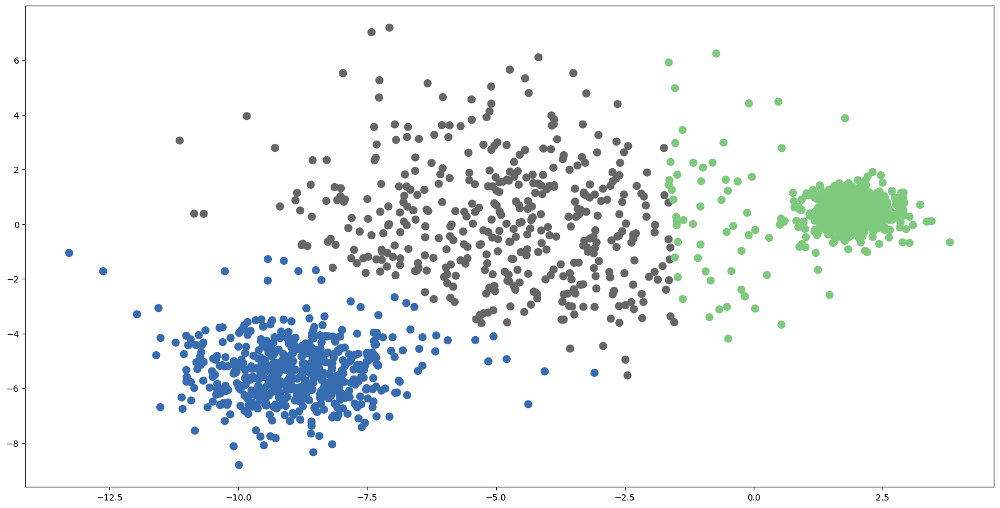

In [39]:
# K-means
sil, wcss, label, centroids = cluster_kmeans(X_varied, 3)
plt.figure(figsize=(20,10))
plt.scatter(X_varied[:,0], X_varied[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: K-Means shows bias toward equal-sized clusters. The large, loose cluster may be split incorrectly while tight clusters stay together. The equal-variance assumption is violated.

**Observation**: K-Means may misassign points in the large, loose cluster.

### Method 2: Agglomerative (Complete Linkage)

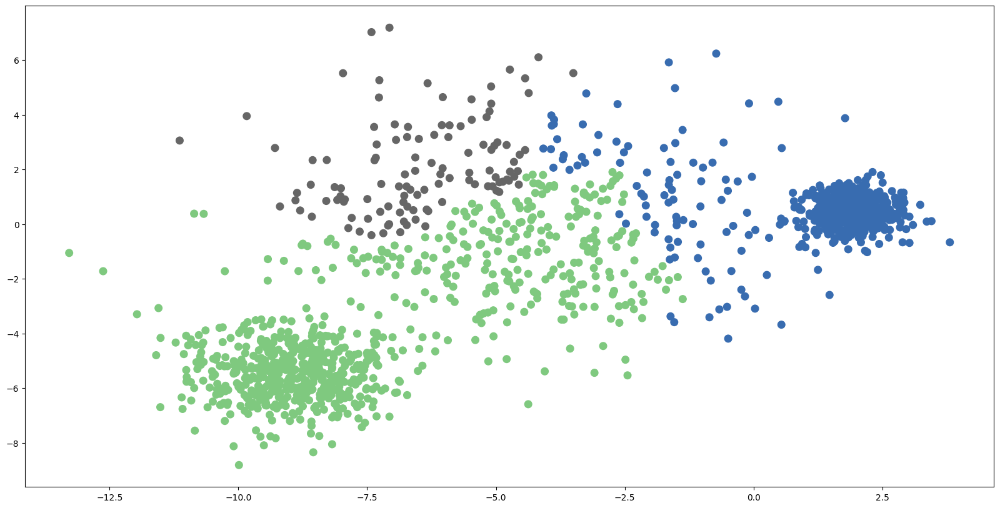

In [40]:
# Agglomerative clustering: complete link
sil, wcss, label, centroids = cluster_agglom(X_varied, 3, link='complete')
plt.figure(figsize=(20,10))
plt.scatter(X_varied[:,0], X_varied[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: Complete linkage adapts better to the different cluster sizes, producing more reasonable groupings than K-Means.

### Method 3: DBSCAN

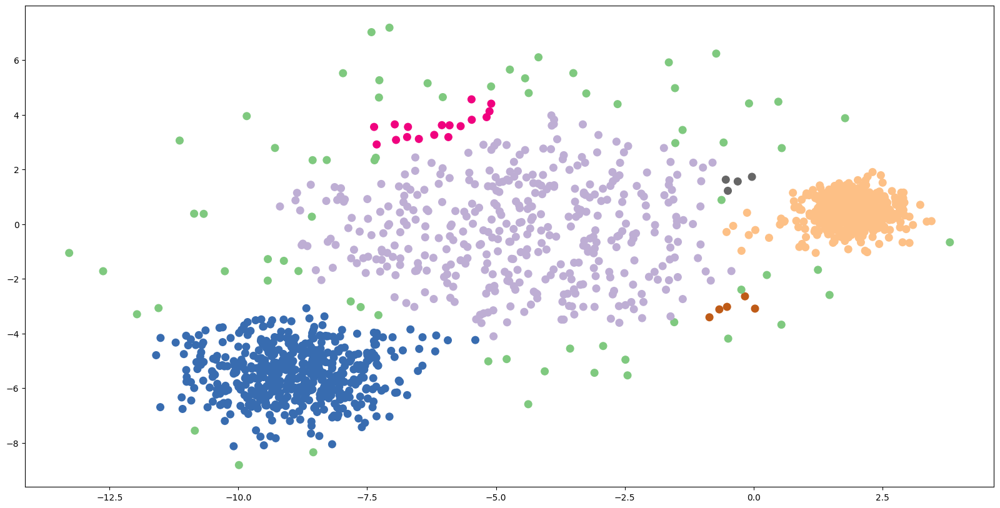

In [41]:
# DBScan
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.6).fit(X_varied) # epsfloat, default=0.5 --> The maximum distance between two samples for one to be considered as in the neighborhood of the other.

label = db.labels_
plt.figure(figsize=(20,10))
plt.scatter(X_varied[:,0], X_varied[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: DBSCAN faces a challenge—a single `eps` value can't simultaneously work well for tight clusters (need small eps) and loose clusters (need large eps). May split loose clusters or merge tight ones.

**Observation**: DBSCAN's single `eps` parameter may split the loose cluster or merge tight ones.

### Method 4: Agglomerative (Single Linkage)

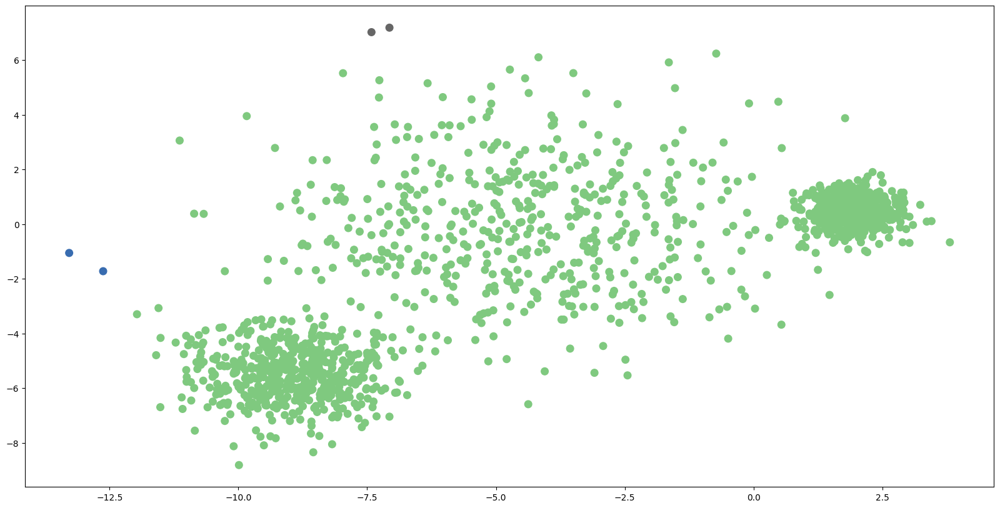

In [42]:
# Agglomerative clustering: single link
sil, wcss, label, centroids = cluster_agglom(X_varied, 3, link='single')
plt.figure(figsize=(20,10))
plt.scatter(X_varied[:,0], X_varied[:,1], c=label, cmap='Accent', s=70)
plt.show()

**Observation**: ⚠️ Single linkage exhibits **severe chaining effect**—almost all points merge into one giant cluster (green), with only a few outliers remaining separate. This is a classic failure mode.

### Summary: Varied Variance Dataset

| Method | Result | Reason |
|--------|--------|--------|
| K-Means | ⚠️ Biased | Assumes equal variance |
| Complete Linkage | ✅ Reasonable | More adaptive to size differences |
| DBSCAN | ⚠️ Difficult | Single `eps` doesn't fit all clusters |
| Single Linkage | ❌ Failed | Severe chaining effect; merges all into one cluster |

**Key Insight:** When clusters have very different densities, complete linkage works better than single linkage, which suffers from chaining.

---

# Overall Summary & Recommendations

## When to Use Each Method

### ✅ Use K-Means When:
- Clusters are **spherical** and well-separated
- Clusters have **similar sizes and densities**
- You need **fast computation** on large datasets
- You know the **number of clusters** in advance

### ✅ Use Hierarchical Clustering When:
- You want to explore **multiple clustering granularities**
- Clusters have **varying shapes** (especially with single linkage)
- You need a **dendrogram** to visualize cluster relationships
- Dataset is **small to medium-sized** (O(n²) complexity)

**Linkage Choice:**
- **Single linkage**: Good for elongated/chained clusters; prone to "chaining effect"
- **Complete linkage**: Produces compact, spherical clusters
- **Average linkage**: Balance between single and complete

### ✅ Use DBSCAN When:
- Clusters have **arbitrary shapes** (non-convex)
- You want to **identify outliers/noise**
- Number of clusters is **unknown**
- Clusters have **similar densities**

**Caution**: Requires careful tuning of `eps` and `min_samples` parameters.

---

## Key Takeaways

1. **No Universal Best Method**: Algorithm choice depends on data structure
2. **Assumptions Matter**: K-Means assumes spherical, equal-variance clusters
3. **Validation is Critical**: Always inspect results visually and with metrics
4. **Parameter Tuning**: DBSCAN and hierarchical methods require parameter selection
5. **Computational Cost**: K-Means is fastest; hierarchical is slowest for large data

---

## Financial Applications

In Digital Finance & Banking, clustering is used for:

- **Customer Segmentation**: Group customers by behavior (K-Means often works well)
- **Credit Risk Assessment**: Identify borrower groups with similar risk profiles
- **Fraud Detection**: DBSCAN can identify anomalous transactions as outliers
- **Portfolio Construction**: Cluster assets by return patterns
- **Market Regime Detection**: Identify different market states (bull/bear/volatile)

---

## Further Reading

- [Scikit-learn Clustering Comparison](https://scikit-learn.org/stable/auto_examples/cluster/plot_cluster_comparison.html)
- [Choosing the Right Clustering Method](https://scikit-learn.org/stable/modules/clustering.html#overview-of-clustering-methods)
- Research Paper: "A Survey of Clustering Algorithms" for theoretical foundations

---

## Practice Exercise

**Task**: Apply these clustering methods to a real financial dataset (e.g., credit card transactions, stock returns, or customer demographics).

**Steps**:
1. Load and preprocess your data
2. Try multiple clustering methods
3. Compare results using silhouette scores and visual inspection
4. Interpret clusters in business context
5. Justify your final algorithm choice

**Questions to Consider**:
- Which method produced the most interpretable clusters?
- Did different methods reveal different insights?
- How would you explain your clustering choice to non-technical stakeholders?